# TASK

The dataset comprises 90 different animal images. Initially, we'll structure it for one-vs-rest classification, followed by binary classification and then a 5-class classification problem. We'll evaluate each model's performance using classification matrices.

1. Dataset Preparation:
   - Organize the dataset for one-vs-rest classification. Perform binary classification using existing architectures and then restructure for 5-class classification. Use 3-fold cross-validation to assess the model.

2. Model Development:
   - Build a custom CNN model without using existing architectures like ResNet or DenseNet.

3. Training and Evaluation:
   - Train the model on prepared datasets for one-vs-rest and 5-class classification.
   - Generate classification matrices for visualization.

4. Convolutional Layer Visualization:
   - Plot the output of all convolutional layers and discuss the insights on automatically created features.


# Importing Libraries

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns

import tensorflow as tf
from tensorflow import keras

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Helper functions

In [33]:
def plot_images(instances):
    # determine rols and cols
    total = len(labels)
    cols = 10
    rows = total // cols
    # print(rows, cols)
        
    plt.figure(figsize=(25,20))
        
    for i in range(total):
        label = labels[i] # label is parent folder for particular image
        plt.subplot(rows, cols, i+1, )
        im = Image.open(dataset_dir + f"/{label}/{instances[label]['data'][0]}")
        plt.imshow(im)
        plt.axis("off")
        plt.title(label, fontsize=12)   

        
    plt.tight_layout()
    plt.show()
    
def plot_aug_imgs(ag_imgs):
    total = len(ag_imgs)
    cols = 6
    rows = total // 6
    
    plt.figure(figsize=(25,20))
        
    for i in range(total):
        plt.subplot(rows, cols, i+1, )
        plt.imshow(ag_imgs[i])
        plt.axis("off")  
    
    
def plot_history(history, save_path=None):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()
    
    
def check_img_label(img, title):
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")
    plt.show()

# Data Visulization and Understanding

In [3]:
dataset_dir = '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals'

labels = np.array(sorted(os.listdir(dataset_dir)))
print(labels)
print("Total classes: ", len(labels))

['antelope' 'badger' 'bat' 'bear' 'bee' 'beetle' 'bison' 'boar'
 'butterfly' 'cat' 'caterpillar' 'chimpanzee' 'cockroach' 'cow' 'coyote'
 'crab' 'crow' 'deer' 'dog' 'dolphin' 'donkey' 'dragonfly' 'duck' 'eagle'
 'elephant' 'flamingo' 'fly' 'fox' 'goat' 'goldfish' 'goose' 'gorilla'
 'grasshopper' 'hamster' 'hare' 'hedgehog' 'hippopotamus' 'hornbill'
 'horse' 'hummingbird' 'hyena' 'jellyfish' 'kangaroo' 'koala' 'ladybugs'
 'leopard' 'lion' 'lizard' 'lobster' 'mosquito' 'moth' 'mouse' 'octopus'
 'okapi' 'orangutan' 'otter' 'owl' 'ox' 'oyster' 'panda' 'parrot'
 'pelecaniformes' 'penguin' 'pig' 'pigeon' 'porcupine' 'possum' 'raccoon'
 'rat' 'reindeer' 'rhinoceros' 'sandpiper' 'seahorse' 'seal' 'shark'
 'sheep' 'snake' 'sparrow' 'squid' 'squirrel' 'starfish' 'swan' 'tiger'
 'turkey' 'turtle' 'whale' 'wolf' 'wombat' 'woodpecker' 'zebra']
Total classes:  90


In [8]:
print(len(labels))

90


In [4]:
instances = {}

In [5]:
for instance in labels:
    all_images = os.listdir(dataset_dir + f"/{instance}")
    
    # can't do like this:
    # instances[instance]["data"] because then "instances" will be empty initially and thus will give key error
    
    instances.setdefault(instance, {})["data"] = np.array(all_images)
    instances.setdefault(instance, {})["total"] = len(all_images)



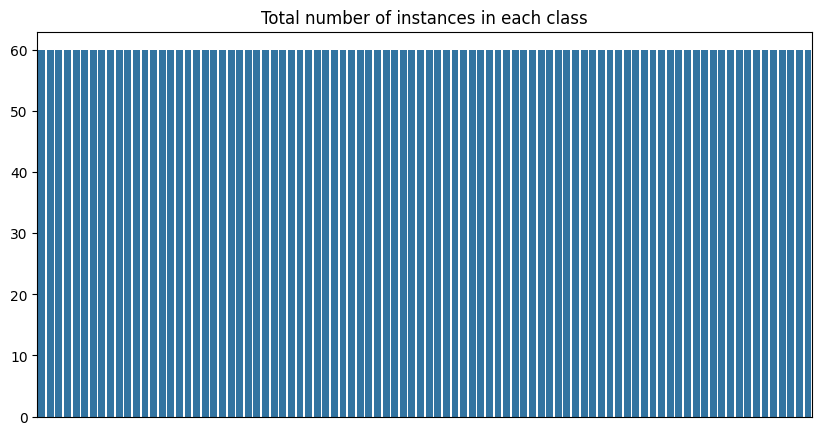

In [46]:
# plot the total number of instances in each class
plt.figure(figsize=(10, 5))
sns.barplot(x=labels, y=[instances[instance]["total"] for instance in labels])
plt.title("Total number of instances in each class")
plt.xticks([], [])
plt.show()

Thus each class contains 60 images.

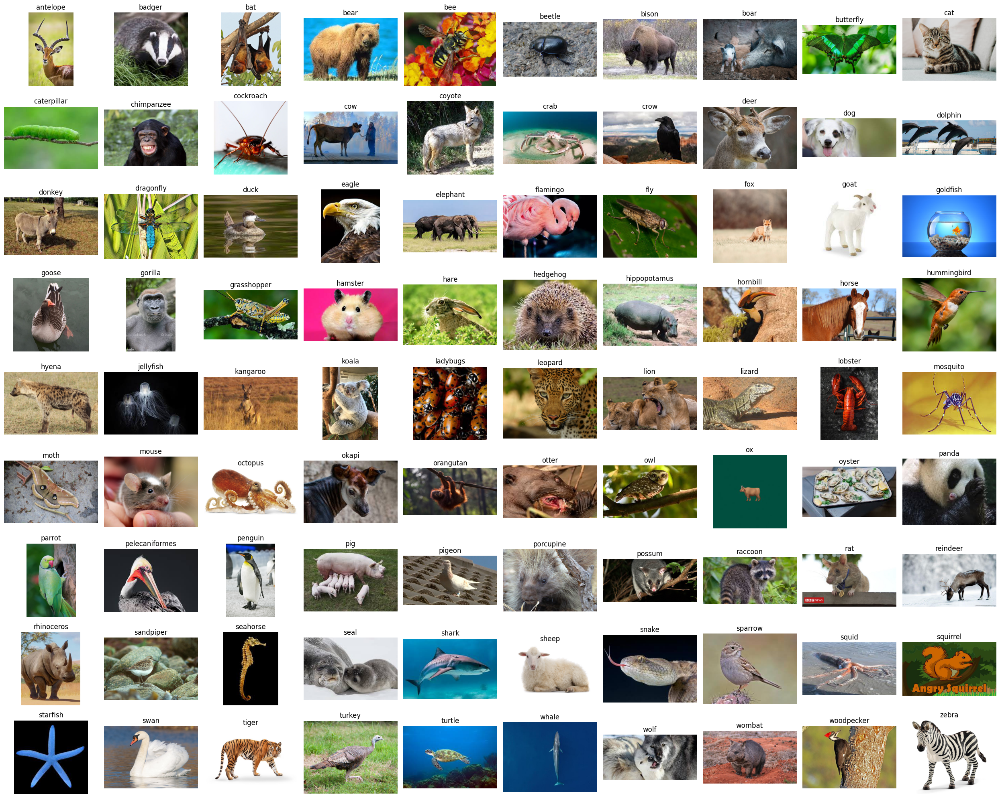

In [84]:
plot_images(instances)

# Reading Images and Creating Labels

In [6]:
images = []
true_labels = []

WIDTH, HEIGHT = 128, 128

for i in range(len(labels)):
    label = labels[i]
    
    all_images = instances[label]["data"]
    print(f"READING {label} images")
    for image in all_images:
        img = Image.open(dataset_dir + f"/{label}/{image}")
        img = img.resize((WIDTH, HEIGHT))
        # normalize the image
        img = np.array(img)
        images.append(img)
        true_labels.append(label)
        
images = np.array(images)

np.save("/kaggle/working/images.npy", images)
np.save("/kaggle/working/true_labels.npy", true_labels)

READING antelope images
READING badger images
READING bat images
READING bear images
READING bee images
READING beetle images
READING bison images
READING boar images
READING butterfly images
READING cat images
READING caterpillar images
READING chimpanzee images
READING cockroach images
READING cow images
READING coyote images
READING crab images
READING crow images
READING deer images
READING dog images
READING dolphin images
READING donkey images
READING dragonfly images
READING duck images
READING eagle images
READING elephant images
READING flamingo images
READING fly images
READING fox images
READING goat images
READING goldfish images
READING goose images
READING gorilla images
READING grasshopper images
READING hamster images
READING hare images
READING hedgehog images
READING hippopotamus images
READING hornbill images
READING horse images
READING hummingbird images
READING hyena images
READING jellyfish images
READING kangaroo images
READING koala images
READING ladybugs imag

# One vs Rest Classification

## OvR Label Creation

In [3]:
images = np.load("images.npy")
true_labels = np.load("true_labels.npy")

labels = np.unique(true_labels)

In [30]:
ovr_labels = np.zeros((len(labels), len(true_labels)))

for i, label in enumerate(labels):
    ovr_labels[i] = (true_labels == label).astype(int)
    
ovr_labels = ovr_labels.astype(np.int32)

In [9]:
images.shape, ovr_labels.shape

((5400, 128, 128, 3), (90, 5400))

In [31]:
np.save("ovr_labels.npy", ovr_labels)

Ovr Lables are of shape 90,5400. So each row contains data for that class and other classes as 0. So basically each row is a binary classification problem.

Now we can first train simple CNN model of single binary classification problem, and then scale it to one vs rest classifier.

## Binary Classification

In [5]:
images = np.load("images.npy")
images = (images / 255.0).astype(np.float32)
true_labels = np.load("true_labels.npy")
labels = np.unique(true_labels)
ovr_labels = np.load("ovr_labels.npy")

### Data Augmentation for Binary Classification

In [5]:
images.shape, ovr_labels.shape

((5400, 128, 128, 3), (90, 5400))

In [69]:
flip = tf.keras.Sequential([
    keras.layers.RandomFlip("horizontal_and_vertical"),
])

rotate = tf.keras.Sequential([
    keras.layers.RandomRotation(0.2)
])

translate = tf.keras.Sequential([
    keras.layers.RandomTranslation((-0.3,0.3), (-0.3,0.3))
])

data_aug_fns = [flip, rotate, translate]

In [66]:
y = ovr_labels[0]
images_to_augment = images[np.where(y == 1)[0]]
images_to_augment.shape

(60, 128, 128, 3)

In [70]:
augmented_imgs = images_to_augment

for fn in data_aug_fns:
    aug_imgs = fn(images_to_augment)
    augmented_imgs = np.vstack((augmented_imgs, aug_imgs))

augmented_imgs.shape

(960, 128, 128, 3)

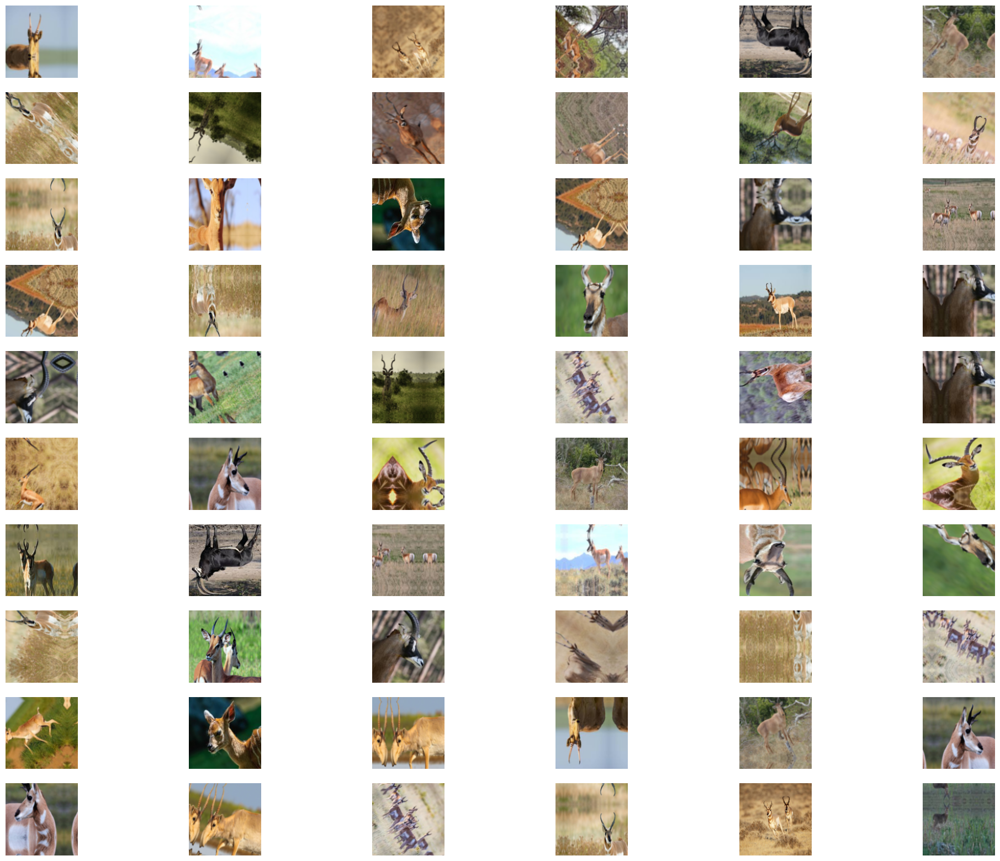

In [73]:
rnd_ns = np.random.randint(low=60, high=augmented_imgs.shape[0], size=60)
plot_aug_imgs(images_to_augment[rnd_ns])

In [74]:
images.shape

(5400, 128, 128, 3)

In [75]:
images = np.vstack((images, images_to_augment[60:]))
images.shape

(6300, 128, 128, 3)

In [77]:
aug_labels = np.ones((images_to_augment[60:].shape[0]))
aug_labels.shape

(900,)

In [81]:
y = np.append(y, aug_labels)
y.shape

(6300,)

### TTS

In [82]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(images, y, test_size=0.2, random_state=42, stratify=y)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((5040, 128, 128, 3), (1260, 128, 128, 3), (5040,), (1260,))

### Model

In [83]:
WIDTH, HEIGHT = 128, 128

model = keras.models.Sequential([
    keras.layers.InputLayer(shape=(WIDTH, HEIGHT, 3)),
    keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Conv2D(64, (3, 3), activation='relu', padding="same"),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Conv2D(64, (3, 3), activation='relu', padding="same"),
    keras.layers.Flatten(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# model.summary()

Epoch 1/50


2024-07-16 13:24:11.728226: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2175: 3.31527, expected 2.86333
2024-07-16 13:24:11.728335: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8832: 3.04387, expected 2.59193
2024-07-16 13:24:11.728346: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8960: 3.285, expected 2.83305
2024-07-16 13:24:11.728357: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 9600: 3.16471, expected 2.71277
2024-07-16 13:24:11.728374: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 12032: 3.08921, expected 2.63726
2024-07-16 13:24:11.728396: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 15360: 3.30205, expected 2.8501
2024-07-16 13:24:11.728472: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32768: 4.65504, expected 3.81534
2024-07-16 13:24:11.728480: E exte

 16/126 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7022 - loss: 1.8621

I0000 00:00:1721136254.648761     125 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7976 - loss: 0.8429

2024-07-16 13:24:17.319582: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 7: 3.72281, expected 3.18193
2024-07-16 13:24:17.319647: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 3.60587, expected 3.06498
2024-07-16 13:24:17.319661: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 9: 3.72594, expected 3.18505
2024-07-16 13:24:17.319671: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 10: 4.12739, expected 3.58651
2024-07-16 13:24:17.319685: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32: 3.9109, expected 3.37001
2024-07-16 13:24:17.319703: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 33: 3.74419, expected 3.20331
2024-07-16 13:24:17.319717: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 43: 3.65307, expected 3.11219
2024-07-16 13:24:17.319728: E external/local_xla/xla

126/126 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - accuracy: 0.7979 - loss: 0.8402 - val_accuracy: 0.8532 - val_loss: 0.3645
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.8565 - loss: 0.3203 - val_accuracy: 0.8800 - val_loss: 0.2901
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.8824 - loss: 0.2806 - val_accuracy: 0.8760 - val_loss: 0.2807
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.8880 - loss: 0.2681 - val_accuracy: 0.8145 - val_loss: 0.3740
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.8533 - loss: 0.2854 - val_accuracy: 0.8304 - val_loss: 0.2911
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.8855 - loss: 0.2669 - val_accuracy: 0.8919 - val_loss: 0.2497
Epoch 7/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.9019 - loss: 0.2506 - val_accuracy: 0.8740 - val_loss: 0.2523
Epoch 8/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.9052 - loss: 0.2321 - val_accuracy: 0.849

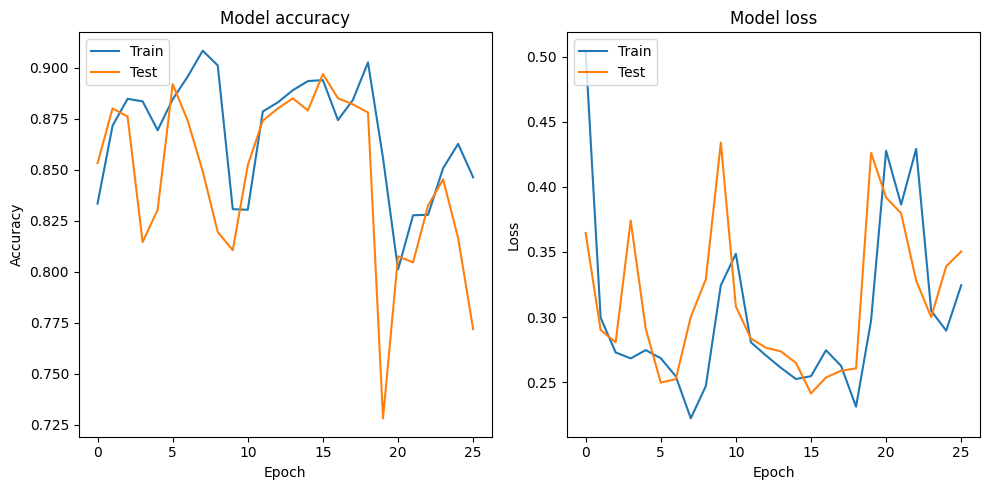

In [84]:
keras.backend.clear_session()
tf.random.set_seed(42)


early_stopping_cb = keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)

h = model.fit(X_train, y_train, epochs=50, validation_split=0.2, callbacks=[early_stopping_cb])
plot_history(h)

In [85]:
results = model.evaluate(X_test, y_test)
print("test loss, test acc:", results)

32/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8843 - loss: 0.2831

2024-07-16 13:24:58.719059: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 12416: 2.94434, expected 2.53672
2024-07-16 13:24:58.719143: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 16324: 3.02946, expected 2.62184
2024-07-16 13:24:58.719154: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 16384: 4.7934, expected 4.00414
2024-07-16 13:24:58.719163: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 16385: 6.12982, expected 5.34056
2024-07-16 13:24:58.719171: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 16386: 6.73761, expected 5.94835
2024-07-16 13:24:58.719179: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 16387: 5.88559, expected 5.09633
2024-07-16 13:24:58.719187: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 16388: 5.01921, expected 4.22995
2024-07-16 13:24:58.719196: 

40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8863 - loss: 0.2802
test loss, test acc: [0.2645714282989502, 0.8960317373275757]


In [86]:
preds = model.predict(X_test)

40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


In [87]:
preds = np.rint(preds).astype(int)
preds = preds.ravel()

In [88]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

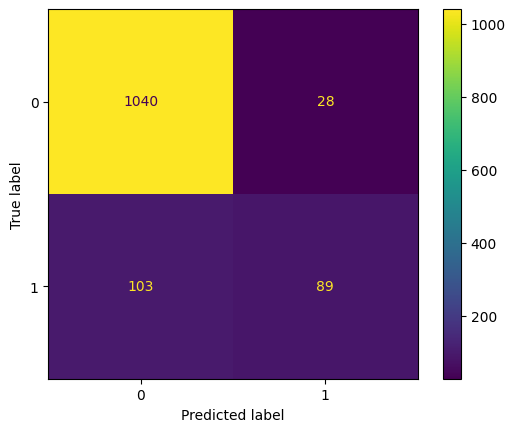

In [89]:
cm = confusion_matrix(y_test, preds)

ConfusionMatrixDisplay(confusion_matrix=cm).plot()
plt.show()

## OvR Classification

### Data preparation

In [40]:
images = np.load("images.npy")
true_labels = np.load("true_labels.npy")
labels = np.unique(true_labels)

In [41]:
X_train, X_test, y_train, y_test = train_test_split(images, true_labels, test_size=0.2, random_state=42, stratify=true_labels)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((4320, 128, 128, 3), (1080, 128, 128, 3), (4320,), (1080,))

In [42]:
np.save("X_train.npy", X_train)
np.save("X_test.npy", X_test)
np.save("y_train.npy", y_train)
np.save("y_test.npy", y_test)

Now our main work will be only with X_train and y_train. We will not touch X_test and y_test.

In [44]:

# creating ovr labels from y_train
ovr_labels = np.zeros((len(labels), len(y_train)))

for i, label in enumerate(labels):
    ovr_labels[i] = (y_train == label).astype(int)
    
ovr_labels = ovr_labels.astype(np.int32)
print(ovr_labels.shape)

np.save("ovr_train_labels.npy", ovr_labels)

(90, 4320)

In [46]:
X_train.shape, y_train.shape, ovr_labels.shape

((4320, 128, 128, 3), (4320,), (90, 4320))

### Model

In [ ]:
# now build model

models = []
history = []

for i in range(ovr_labels.shape[0]):
    model = keras.models.Sequential([
        keras.layers.InputLayer(shape=(WIDTH, HEIGHT, 3)),
        keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        keras.layers.MaxPooling2D((2, 2)),
        keras.layers.Conv2D(64, (3, 3), activation='relu', padding="same"),
        keras.layers.MaxPooling2D((2, 2)),
        keras.layers.Conv2D(64, (3, 3), activation='relu', padding="same"),
        keras.layers.Flatten(),
        keras.layers.Dense(64, activation='relu'),
        keras.layers.Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    early_stopping_cb = keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)
    
    h = model.fit(X_train, ovr_labels[i], epochs=50, validation_split=0.2, callbacks=[early_stopping_cb])
    
    history.append(h)
    models.append(model)